# Accesing the memberships of stars in Open Clusters using `Random Forest` with GAIA data

This notebook is an attempt to reproduce the data analysis process as mentioned in Mahmudunnobe, M. et. al 2021 ([Membership of Stars in Open Clusters using Random Forest with Gaia Data.](https://doi.org/10.1140/epjs/s11734-021-00205-x)) to serve as a handout for the Master Seminar on [Dynamics of Galaxies, Star Clusters and Planetary Systems](https://wwwstaff.ari.uni-heidelberg.de/just/teaching/WS22/MVSem/) for the WS2022/23 at the Heidelberg University.

In [1]:
# numpy
import numpy as np

# database handling package
import glob
import os
import pandas as pd 
pd.options.mode.chained_assignment = None  # default='warn'


# plotting packages
from matplotlib import colors
import matplotlib.pyplot as plt
%matplotlib inline

plt.rc('font', family='monospace', size=14, serif='courier')
plt.rc('mathtext', fontset='stix')

#for interactive plots
import plotly.express as px 
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import seaborn as sns

#astropy packages
import astropy.units as u
from astroquery.vizier import Vizier
from astroquery.gaia import Gaia
import astropy.coordinates as coord
from astropy.table import vstack

#aesthetics
from pprint import pprint


# scikit-learn packages (for Supervised ML)
from sklearn.ensemble import RandomForestClassifier
# from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn import preprocessing

---
# 1. Getting the data


## 1.1. Getting Catalog data for preliminary analysis

For this notebook, we will be using the  `'J/A+A/618/A93/'` catalog (*Gaia DR2 open clusters in the Milky Way (Cantat-Gaudin+, 2018)*). 

The catalog has been created using the `UPMASK` package (Krone-Martins, A. and Moitinho, A., “UPMASK: unsupervised photometric membership assignment in stellar clusters”, *Astronomy and Astrophysics*, vol. 561, 2014. doi:10.1051/0004-6361/201321143.
)

In [2]:
catalogs = Vizier.get_catalogs('J/A+A/618/A93/') # getting the catalog from Vizier
print(catalogs)

[print(f"Table: {catalog.meta['name']} has columns:{catalog.columns} \n") for catalog in catalogs]

TableList with 2 tables:
	'0:J/A+A/618/A93/table1' with 18 column(s) and 50 row(s) 
	'1:J/A+A/618/A93/members' with 16 column(s) and 50 row(s) 
Table: J/A+A/618/A93/table1 has columns:<TableColumns names=('Cluster','RAJ2000','DEJ2000','GLON','GLAT','r50','Nstars','pmRA','pmDE','plx','dmode','dmode_01','dmode-01','X','Y','Z','Rgc','SimbadName')> 

Table: J/A+A/618/A93/members has columns:<TableColumns names=('RA_ICRS','DE_ICRS','Source','GLON','GLAT','plx','pmRA','pmDE','o_Gmag','Gmag','BP-RP','PMemb','Cluster','SimbadName','_RA.icrs','_DE.icrs')> 



[None, None]

In [3]:
# name of the clusters listed in Mahmudunnobe, M. et. al 2021 
names = ['NGC 581','NGC 1893','IC 1805','NGC 6231','NGC 3293','NGC 6913','NGC 2264','NGC 2244','NGC 6823']

# relevant columns needed for our purpose
rel_col = ['Cluster', 'RAJ2000', 'DEJ2000', 'GLON', 'GLAT', 'r50', 'Nstars', 'pmRA', 'e_pmRA', 'pmDE', 'e_pmDE', 'plx', 'e_plx', 'dmode', 'X', 'Y', 'Z', 'Rgc']

table1 = Vizier(catalog='J/A+A/618/A93/table1', # catalog name
                columns=rel_col,                # relevant columns needed for our purpose
                row_limit=-1                    # row limit to get all the dataset
                ).query_object(names            # querying the listed clusters only
                )[0]

table1 # checking the table1

table1_df = table1.to_pandas()                # converting the table to pandas dataframe
table1_df = table1_df.applymap(lambda x: x.decode() if isinstance(x, bytes) else x) # Converting bytes to strings if any

In [4]:
# relevant columns needed for our purpose
rel_col = ['RA_ICRS','DE_ICRS','Source','GLON','GLAT','plx','e_plx','pmRA','pmDE','e_pmRA','e_pmDE','o_Gmag','Gmag','BP-RP','PMemb','Cluster',]

members = Vizier(catalog='J/A+A/618/A93/members',       # catalog name
                columns=rel_col,                        # relevant columns needed for our purpose
                row_limit=-1                            # row limit to get all the dataset
                ).query_constraints(
                    Cluster=table1_df['Cluster'].to_list() # querying the clusters from above table
                    )[0]


members # checking the members table

members_df = members.to_pandas()                             # converting the table to pandas dataframe
members_df = members_df.applymap(lambda x: x.decode() if isinstance(x, bytes) else x) # Converting bytes to strings if any


- As you can see in the above dataset, all the columns are considered as the `features` of the dataset, except the `PMemb` (Probability Membership) column which, in our case, acts as the `label`. 
  
- In the queried catalog, stars with `PMemb > 0` are considered members, else non-members.
  
## 1.2. Filtering the data

- Having a good and diverse `training dataset` is very crucial for the performance of our Random Forest model. A bad training set will wreak havoc on our RF model. 

- For creating a good `training set`, we need to filter the bad data. As mentioned in the paper, we will be applying these filter cuts:
  
  - `parallax_over_error > 3`
  
  - `pmra_error < 0.3`
  
  - `pmdec_error < 0.3`
  

- To make the `training dataset`, an equal no. of both `members` and `field stars` have been taken. This insures that my ML model identifies both classes.

In [5]:
# calculting parallax_over_error column
members.add_column(members['plx'] / members['e_plx'],name='plx_over_err')

print(f'{members_df.shape = }')

# applying the filtering cuts
cg_members = members[np.where((members['e_pmRA']<0.3)&(members['e_pmDE']<0.3)&(members['plx_over_err']>3))]
cg_members_df = cg_members.to_pandas().applymap(lambda x: x.decode() if isinstance(x, bytes) else x)

print(f'{cg_members_df.shape = }')

members_df.shape = (5786, 16)
cg_members_df.shape = (4669, 17)


---

## 1.3. Cluster Radius

- We have now a filtered dataset which we will call `CG Members` from here on.
  
- To get the `field stars`, we need to query GAIA DR2 server for stars that are beyond the `Cluster Radius`. But the above catalog tables doesn't mention this property therefore we have to calculate it on our own.


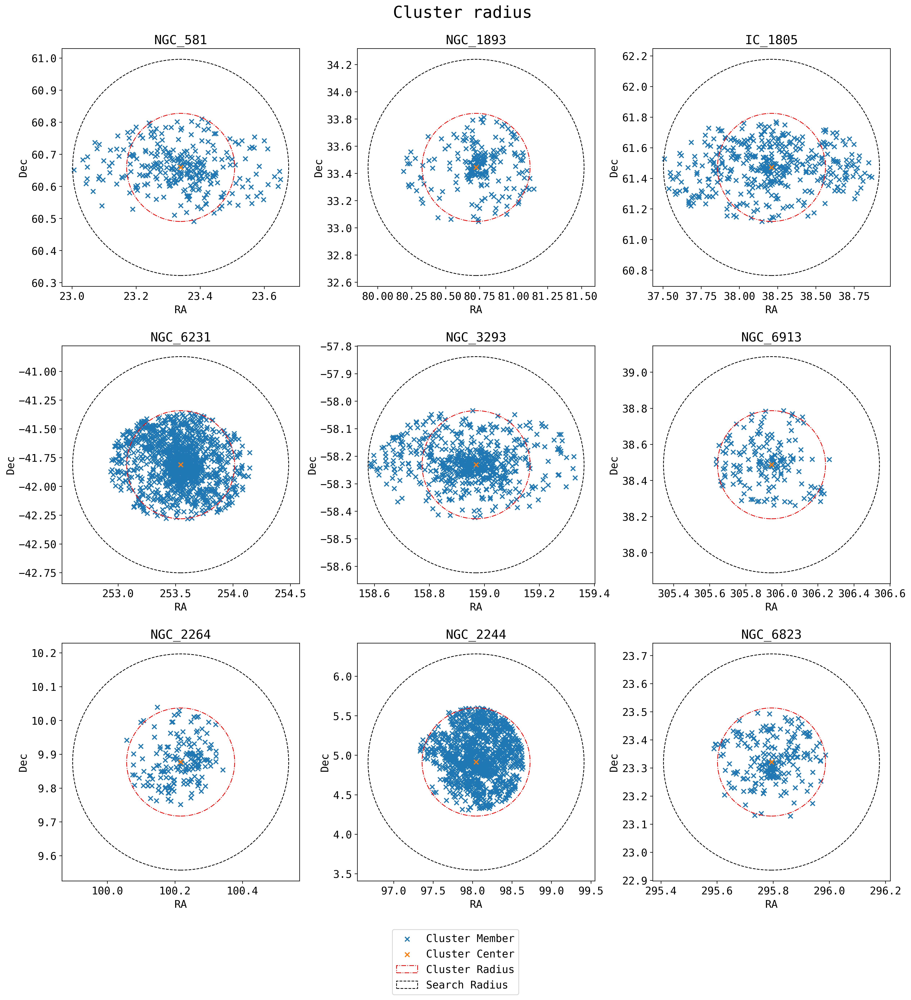

In [6]:
# calculating the max. radius of cluster
# max. radius is defined as the distance of the farthest members from the center

plt.figure(figsize=(20,20),dpi=300)
plt.subplots_adjust(hspace=0.25)
plt.suptitle('Cluster radius', fontsize=22, y=0.92)

plt.tight_layout()
#setting no. of rows and columns for subplot
ncols = 3
nrows = len(table1['Cluster']) // ncols + (len(table1['Cluster']) % ncols > 0) # calculating number of rows

max_r = []
for n,wi in enumerate(table1['Cluster']):

    # quering the positions of members in a cluster
    ra_stars,de_stars = cg_members['RA_ICRS'][np.where(cg_members['Cluster'] == table1['Cluster'][n])],cg_members['DE_ICRS'][np.where(cg_members['Cluster'] == table1['Cluster'][n])]
    
    # quering the position of cluster center 
    ra_cluster,de_cluster = table1['RAJ2000'][np.where(table1['Cluster'] == table1['Cluster'][n])], table1['DEJ2000'][np.where(table1['Cluster'] == table1['Cluster'][n])]

    # caculating the distance array
    del_ra = np.abs(ra_stars - ra_cluster)
    del_de = np.abs(de_stars - de_cluster)

    # calculating the radius based on the farthest member
    # r = (np.max(del_ra)**2 + np.max(del_de)**2)**0.5
    if np.max(del_ra) > np.max(del_de):
        r = np.round(np.max(del_de),4)
    else:
        r = np.round(np.max(del_ra),4)
    max_r.append(r)

    #adding subplot iteratively
    ax = plt.subplot(nrows, ncols, n + 1)

    ax.scatter(ra_stars,de_stars,marker='x',label='Cluster Member')        # stars
    ax.scatter(ra_cluster,de_cluster,marker='x',label='Cluster Center')    # cluster centers

    ax.add_patch(plt.Circle((ra_cluster,de_cluster),r,fill=False,color='r',ls='-.',label='Cluster Radius'))  # cluster radius
    ax.add_patch(plt.Circle((ra_cluster,de_cluster),2*r,fill=False,color='k',ls='--',label='Search Radius')) # search radius

    # chart aesthetics
    ax.set_aspect('equal')
    ax.set_xlabel('RA')
    ax.set_ylabel('Dec')
    # ax.legend(loc=(1.1,0.9))
    ax.set_title(table1['Cluster'][n])

#plotting common legend
handles, labels = ax.get_legend_handles_labels()
plt.gcf().legend(handles, labels, loc='lower center')


max_r = np.array(max_r)*u.deg
search_radius = 2*max_r


- In the plots, it's visible that for a few clusters, the members lie even beyond the the `cluster radius` but for our purpose it's not to worry much as we work in `search radius` area.

- `Search Radius` defines the area where we will be applying our `Random Forest` model to search for new members.

- For our field star population, we will taking a random sample of the stars which lie beyond the `search radius` in order to ensure that the stars we take are field stars.
--- 

## 1.4. NGC 6231

- Once having the `Cluster Radius` of all the listed clusters, we can now move forward to query the GAIA DR2 dataset for that cluster.

- For the purpose of this notebook, I am showing the process for a single cluster only, NGC 6231, as the main emphasis is to introduce the SUpervised Machine Learning techniques. One can use the same steps for multiple clusters.

- For querying the data, we will use `astroquery` package.

In [7]:
# script for checking if the dataframes are already downloaded and available offline or else download and save them.

i = np.where(table1['Cluster']=='NGC_6231') # querying a GAIA DR2 data for a cluster

saving = True 


curpath = os.path.abspath('.')              # current working directory
dataFolder = os.path.join(curpath, 'data')  # path to data folder
dataFiles = glob.glob(os.path.join(dataFolder,'*parquet')) 

if len(dataFiles) == 0:
    print('No Offline Dataframe found. Proceeding to download the dataset from GAIA server.')

    # getting the properties of cluster from vizier table
    ra = table1['RAJ2000'][i].data[0]
    dec = table1['DEJ2000'][i].data[0]
    rad = search_radius[i].data[0]

    
    # gaia TAP query for getting the stars in search radius
    cluster = Gaia.launch_job_async("SELECT ra, dec, parallax, pmra, pmdec, source_id, phot_g_mean_mag, bp_rp \
                            FROM gaiadr2.gaia_source WHERE 1=CONTAINS(POINT('ICRS',ra,dec),  CIRCLE('ICRS',"+str(ra) +", "+str(dec) +", "+ str(rad)+" )) \
                            and abs(parallax_over_error) > 3 and pmra_error < 0.3 and pmdec_error < 0.3").get_results().to_pandas()

    # gaia TAP query for getting the stars beyond search radius
    cluster_non_memb = Gaia.launch_job_async("SELECT ra, dec, parallax, pmra, pmdec, source_id \
                            FROM gaiadr2.gaia_source WHERE 1=CONTAINS(POINT('ICRS',ra,dec),  CIRCLE('ICRS',"+str(ra) +" , "+str(dec) +" , "+ str(rad + 0.2)+" )) \
                            and 0=CONTAINS(POINT('ICRS',ra,dec),  CIRCLE('ICRS',"+str(ra) +" , "+str(dec) +" , "+ str(rad)+" )) \
                            and abs(parallax_over_error) > 3 and pmra_error < 0.3 and pmdec_error < 0.3").get_results().to_pandas()

    if saving == True:
        cluster.to_parquet(f'data/{table1["Cluster"][i].data[0]}.parquet')
        cluster_non_memb.to_parquet(f'data/{table1["Cluster"][i].data[0]}_non_memb.parquet')

    print('Dataframes downloaded and loaded.')
else:
    pprint(f'Offline Dataframe found that match your search: {dataFiles}')

    cluster = pd.read_parquet(f'data/{table1["Cluster"][i].data[0]}.parquet')                    
    cluster_non_memb = pd.read_parquet(f'data/{table1["Cluster"][i].data[0]}_non_memb.parquet')


('Offline Dataframe found that match your search: '
 "['/Users/bhavesh/coding/MSc/MVSem/data/NGC_6231.parquet', "
 "'/Users/bhavesh/coding/MSc/MVSem/data/NGC_6231_non_memb.parquet']")


In [8]:
# creating a CG member sub-dataset for cluster only
cg_memb_cluster = cg_members_df.query("Cluster == 'NGC_6231'")[["RA_ICRS", "DE_ICRS", "plx", "pmRA", "pmDE", "Source", "Gmag", "BP-RP", "PMemb"]].sample(n=cg_members_df.query("Cluster == 'NGC_6231'").shape[0],random_state=42)

# renaming the column names for ease of use
cg_memb_cluster = cg_memb_cluster.rename(columns={"RA_ICRS": "ra", 
                                "DE_ICRS": "dec", 
                                "plx":"parallax",
                                "pmRA":"pmra",
                                "pmDE":"pmdec",
                                "Source":"source_id",
                                'Gmag':'phot_g_mean_mag', 
                                'BP-RP':'bp_rp'
                                })

cg_memb_cluster['PMemb'] = 1    # setting Membership probability of all of the CG Members as 1



# subtracting the CG members from queried GAIA dataframe
cluster_sub = cluster.loc[~cluster['source_id'].isin(cg_memb_cluster['source_id'])]

# sampling non-members to the no. of CG members
cluster_non_memb_sub = cluster_non_memb.sample(n=cg_memb_cluster.shape[0],random_state=42)
cluster_non_memb_sub['PMemb'] = 0 # setting the membership of all non-members as 0


# combining the member and non-member dataset to make the training and testing dataset
combine_dataset = pd.concat([cg_memb_cluster, cluster_non_memb_sub])

- Plotting the cluster and it's search radius

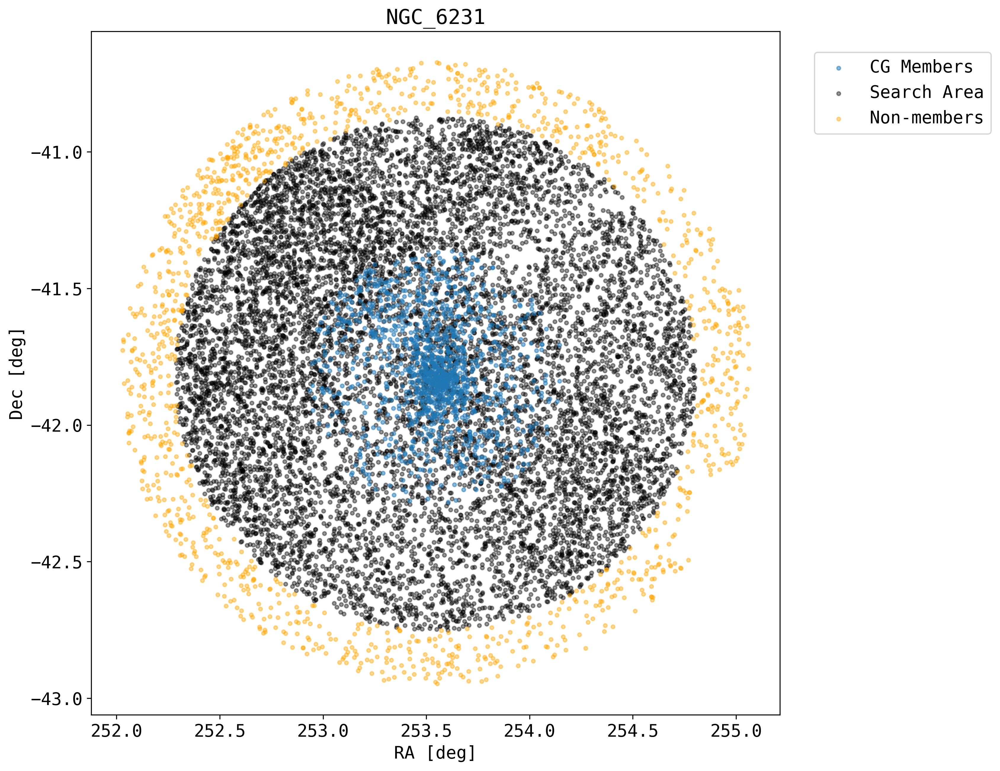

In [9]:
plt.figure(figsize=(10,10),dpi=300)

# plotting CG members
plt.scatter(cg_memb_cluster['ra'], cg_memb_cluster['dec'], marker='.',alpha=0.5, label='CG Members',zorder=3)

# plotting stars in search radius  (sampled for better visualization)
plt.scatter(cluster_sub['ra'].sample(n=10000,random_state=42),cluster_sub['dec'].sample(n=10000,random_state=42),
            marker='.',color='k',alpha=0.4, label='Search Area',zorder=2)

# plotting stars queried beyond the search radius
plt.scatter(cluster_non_memb_sub['ra'], cluster_non_memb_sub['dec'],marker='.',color='orange',alpha=0.4, label='Non-members',zorder=2)


# defining a function to help us every time set plot attributes
def chart_attribs(axs,axis_labels):
    '''Sets the plot attributes

    :param axs: axis of the plot
    :type axs: matplotlib.pyplot.axis()

    :param axis_labels: labels of the plot axis
    :type axis_labels: (str,str)
    '''
    axs.set_xlabel(f'{axis_labels[0]}')
    axs.set_ylabel(f'{axis_labels[1]}')
    axs.set_title(f"{table1['Cluster'][3]}")
    axs.legend(loc=(1.05,0.85))
    # axs.set_xlim(22.9,23.8)
    # axs.set_ylim(60.4,61)
    # axs.set_aspect('equal')
    

chart_attribs(plt.gca(),('RA [deg]','Dec [deg]'))

---

## 1.5. Train, Test and Validation

- Once we have our combined dataset, it needs to be split into three datasets: `train`, `test` & `validation`
  
  - For this, we will use an in-built function `sklearn.model_selection.train_test_split` which will give us `train` & `test` dataset
  
  - The `train` set will be further divided into `validation` subparts. This process will be done automatically during the `cross-validation` step. 


- For features, we will only use: `pmra`, `pmdec`, `parallax`. We have already fixed the position parameters by defining `search radius`. And the reason is that it's highly probable that the model might just learn to simply truncate at the cluster radius which will make our model biased. 

In [10]:
y = combine_dataset.pop('PMemb')                      # targets (labels)
X = combine_dataset[['pmra', 'pmdec', 'parallax']]    # independent variables (features)

# dataset -> train & test
X_train, X_test, y_train, y_test  = train_test_split(X, y, test_size=0.3, random_state=42, shuffle=True)

---
# 2. Training the Random Forest model

- For training the model, we will be following these steps:
  
  - S1. Initializing the `Random Forest (RF)` classifier. 
  
  - S2. Defining the `Hyperparamter` grid.
  
  - S3. `Hyperparamter Tuning`,  `Cross-Validation` & `Training` 
  
  - S4. Testing and Scoring the model
  

## 2.1. Initializing the RF classifier

In [11]:
RF = RandomForestClassifier(random_state=42)

#getting the list of our RF hyperparameters
pprint(RF.get_params())

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


## 2.2. Defining the `Hyperparameter` grid

- The grid will be used for choosing the best hyperparameters for our model using Random Search. 

In [12]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1000, num = 10)]

# Number of features to consider at every split
max_features = ['sqrt','log2']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 7, 9, 12]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Method of selecting samples for training each tree
bootstrap = [True] 
oob_score = [True] # out-of-bag estimate

# complexity parameter in random forest
ccp_alpha = [2**-10, 2**-9, 2**-8, 2**-7, 2**-6, 2**-5, 2**-4, 2**-3, 2**-2, 2**-1, 0]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap,
               'oob_score': oob_score,
               'ccp_alpha':ccp_alpha}
pprint(random_grid,width=120)

{'bootstrap': [True],
 'ccp_alpha': [0.0009765625, 0.001953125, 0.00390625, 0.0078125, 0.015625, 0.03125, 0.0625, 0.125, 0.25, 0.5, 0],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['sqrt', 'log2'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 7, 9, 12],
 'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000],
 'oob_score': [True]}


## 2.3. `Hyperparamter Tuning`, `Cross-Validation` & `Training` 

- We will use `sklearn.model_selection.RandomizedSearchCV` for performing a `Random Search` `5-fold Cross-Validation` on our training dataset for `100 iterations` with `f1 scoring`

In [13]:
# training and cross-validating our RF model
RF_random = RandomizedSearchCV(estimator = RF, 
                                param_distributions = random_grid, 
                                n_iter = 100,       # no. of hyperparamter settings that are sampled
                                cv = 5,             # no. of folds
                                scoring='f1',       # metric for evaluation
                                refit=True,         # refits (trains) the model on whole dataset using best chosen hyperparameters
                                # verbose=2, 
                                random_state=42, 
                                n_jobs = -1)        # using all the cpu cores for estimation

# Fit the random search model
RF_random.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
                   n_iter=100, n_jobs=-1,
                   param_distributions={'bootstrap': [True],
                                        'ccp_alpha': [0.0009765625, 0.001953125,
                                                      0.00390625, 0.0078125,
                                                      0.015625, 0.03125, 0.0625,
                                                      0.125, 0.25, 0.5, 0],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['sqrt', 'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 7, 9, 12],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000],
                                        'oob_score': [True]},
                   random_state=42, scoring='f1')

In [14]:
print(f'Best Hyperparameters: {RF_random.best_params_}\n') # printing the best chosen hyperparameters

print(f'Best Score: {RF_random.best_score_:.3f}') # printing the best score achieved by a model

RF = RF_random.best_estimator_ # getting the model with the best set of hyperparameters

Best Hyperparameters: {'oob_score': True, 'n_estimators': 1000, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': 60, 'ccp_alpha': 0.03125, 'bootstrap': True}

Best Score: 0.965


## 2.4. Testing and Scoring the model

- In moslty all the `sklearn` modules (functions), 
  
  - `.fit(X,y)` trains your module on `X` dataset which has `y` labels
  
  - `.predict(X)` tests your module on  `X` dataset and *returns* `y` labels

- Therefore, to test our model, we will input our `X_test` dataset and will compare the *predicted labels*, `y_pred` with *true labels*.

              precision    recall  f1-score   support

  Non-Member       0.98      0.93      0.96       402
      Member       0.94      0.98      0.96       411

    accuracy                           0.96       813
   macro avg       0.96      0.96      0.96       813
weighted avg       0.96      0.96      0.96       813



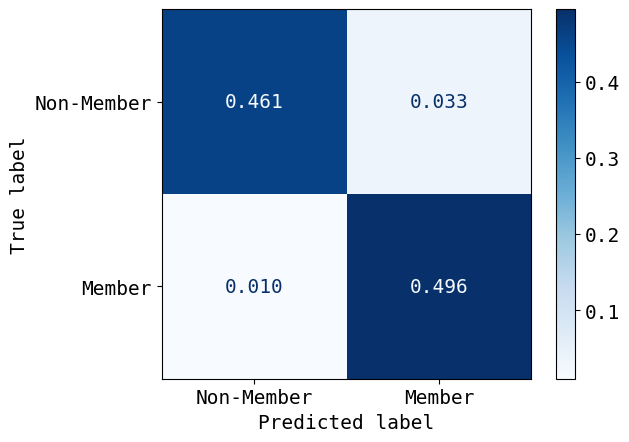

In [15]:
y_pred = RF.predict(X_test)          # testing the model

# printing the model performance scores
print(classification_report(y_test, y_pred, target_names=['Non-Member','Member']))

# displaying the confusion matrix
ConfusionMatrixDisplay(confusion_matrix(y_test, y_pred, normalize='all'),
                        display_labels=['Non-Member','Member']).plot(cmap='Blues',ax=plt.gca(),values_format='.3f');

- As we can see, we got a model with `96%` accuracy, which is quite good.
  
- Also, from the Confusion Matrix, we can see:
  -  `True Positives = 0.461`
  
  -  `True Negatives = 0.496`
  
-  This is good because, for our dataset, we combined 50% of members and non-members each. And we can see that our model was able to separate them quite well. With this, our model is ready to be applied to the stars we queried in `search radius`

# 3. Running RF model on the Data

- Once we have our model, we can use the `RF.predict()` to classify the stars we queried from GAIA and proceed to further analysis.

In [16]:
# predicting the classes of target dataframe
classes = RF.predict(cluster_sub[['pmra','pmdec','parallax']])

# adding the class column in our dataframe
cluster_sub['PMemb'] = classes

In [17]:
print(f"Old Members: {cg_memb_cluster['ra'].size}")
print(f"New Members: {np.where(cluster_sub['PMemb'] == 1)[0].size}")

print(f"New Members/Old Members ratio: {np.where(cluster_sub['PMemb'] == 1)[0].size / cg_memb_cluster['ra'].size}")

Old Members: 1354
New Members: 2816
New Members/Old Members ratio: 2.0797636632200884


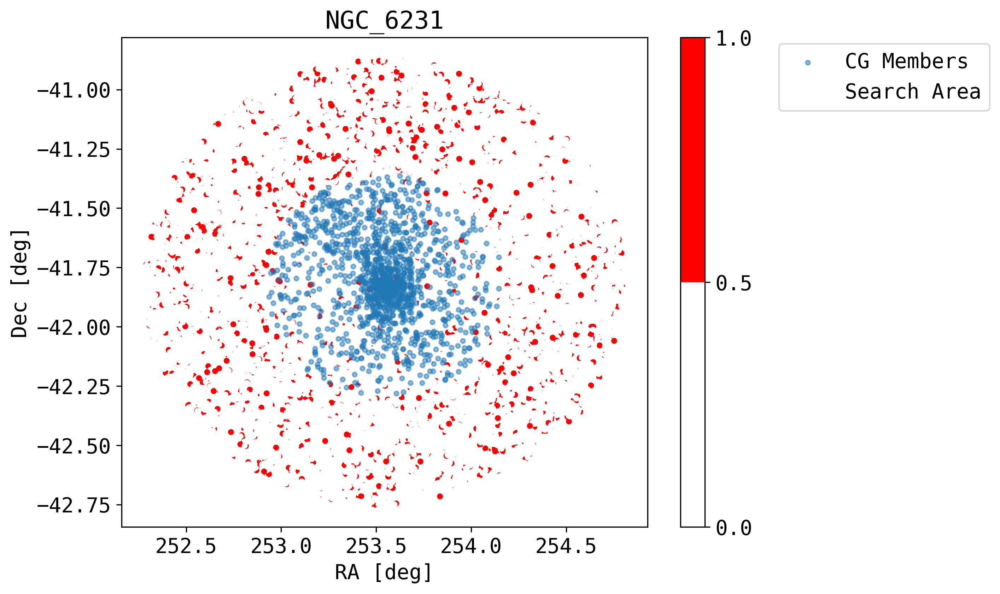

In [18]:
plt.figure(figsize=(8,6),dpi=300)

plt.scatter(cg_memb_cluster['ra'], cg_memb_cluster['dec'], marker='.',alpha=0.5, label='CG Members',zorder=3)

# make a color map of fixed colors
cmap = colors.ListedColormap(['white', 'red'])
bounds=[0,0.5,1]
norm = colors.BoundaryNorm(bounds, cmap.N)

sct2 = plt.scatter(cluster_sub['ra'],
            cluster_sub['dec'],marker='.', label='Search Area',c=cluster_sub['PMemb'], cmap=cmap, zorder=0,#,color='k'
            )

plt.colorbar(sct2, 
            cmap=cmap, 
            norm=norm, boundaries=bounds, 
            ticks=[0, 0.5, 1], 
            label='')

chart_attribs(plt.gca(),('RA [deg]','Dec [deg]'))
plt.legend(loc=(1.25,0.85))

- Getting the sense of distribution is quite tough from a scatter plot therefore we will use `Kernel Density Estimate (KDE)` plots to visualise our result plots.


## 3.1. KDE Plots

In [26]:
# dataframe which only has the new members
new_memb = cluster_sub.iloc[np.where(classes == 1)[0]]

# combining the CG members and candidates from the search radius
cluster = pd.concat([cg_memb_cluster, new_memb])

### 3.1.1. Position Space Plots

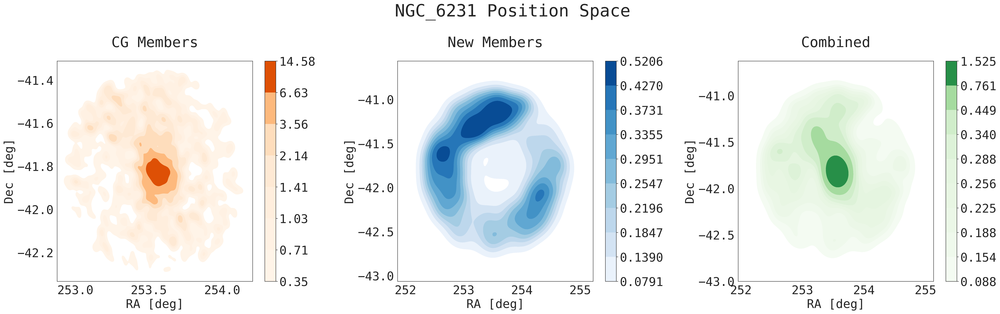

In [147]:
# plot aesthetics
sns.set_style('white')
plt.rc('font', family='monospace', size=24, serif='courier')

# subplot initialization
fig,ax = plt.subplots(1,3,figsize=(30,10),dpi=300)
fig.tight_layout(pad=5)

# postion distribution plotting
sns.kdeplot(x=cg_memb_cluster['ra'], y=cg_memb_cluster['dec'],
            fill=True,cbar=True, 
            bw_adjust=0.3,
            cmap='Oranges',
            levels=8, 
            ax=ax[0])

sns.kdeplot(data=new_memb,x='ra',y='dec',fill=True,cbar=True, 
            bw_adjust=0.8,
            cmap=sns.color_palette("Blues", as_cmap=True),
            levels=10, 
            ax=ax[1])

sns.kdeplot(data=cluster,x='ra',y='dec',fill=True,cbar=True, 
            bw_adjust=0.8,
            cmap=sns.color_palette("Greens", as_cmap=True),
            levels=10, 
            ax=ax[2])

# plot attributes 
def chart_attribs(axs,title):
    axs.set_xlabel('RA [deg]')
    axs.set_ylabel('Dec [deg]')
    axs.set_title(title,y=1.05)
titles = ['CG Members', 'New Members', 'Combined']
[chart_attribs(ax[i],titles[i]) for i in range(3)]

fig.suptitle(f'{table1["Cluster"][3]} Position Space',size=34);

- With the first plot only, we can see that our *trained*  `Random Forest` model has done some good work. 
  
- It was able to find new members double the no. of old members.
  
- And we can also see a few bimodalities in the newly found members.

### 3.1.2. Proper Motion Plots

Text(0.5, 0.98, 'NGC_6231 Proper Motion Space')

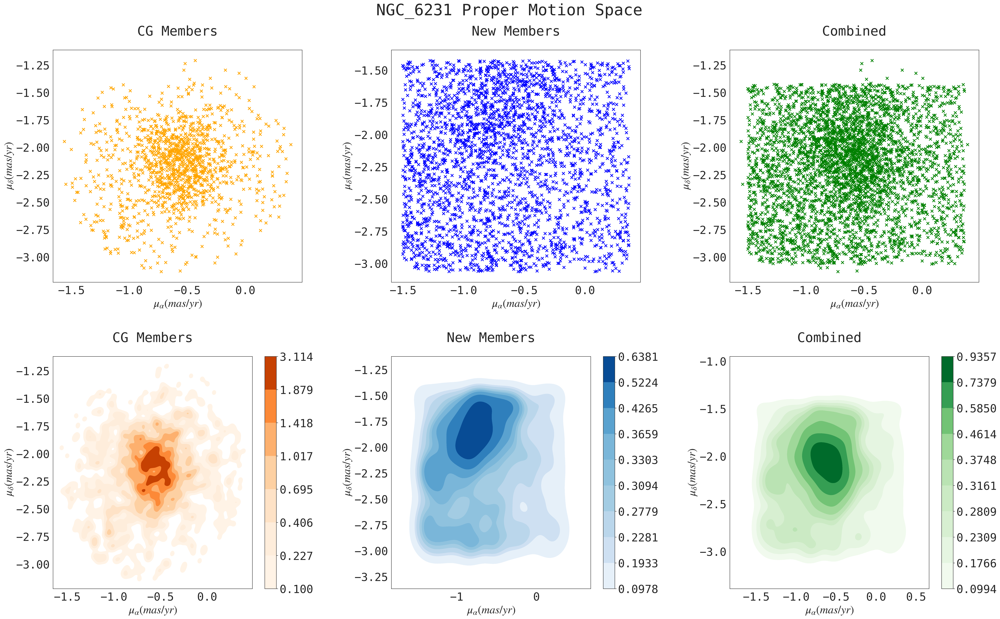

In [149]:
# plot aesthetics
plt.rc('font', family='monospace', size=24, serif='courier')

# subplot initialization
fig,ax = plt.subplots(2,3,figsize=(32,20),dpi=300)
fig.tight_layout(pad=5)

# plotting normal scatter plot
ax[0,0].scatter(x=cg_memb_cluster['pmra'], y=cg_memb_cluster['pmdec'],
            c='Orange',marker='x')

ax[0,1].scatter(x=new_memb['pmra'],y=new_memb['pmdec'],
            c='b',marker='x')

ax[0,2].scatter(x=cluster['pmra'],y=cluster['pmdec'],
            c='g',marker='x'
            )

# plotting KDE plots 
sns.kdeplot(x=cg_memb_cluster['pmra'], y=cg_memb_cluster['pmdec'], fill=True,cbar=True,  bw_adjust=0.3,
            cmap='Oranges', levels=8, ax=ax[1,0])

sns.kdeplot(data=new_memb,x='pmra',y='pmdec',fill=True,cbar=True, bw_adjust=0.8,
            cmap=sns.color_palette("Blues", as_cmap=True), levels=10, ax=ax[1,1])

sns.kdeplot(data=cluster,x='pmra',y='pmdec',fill=True,cbar=True, bw_adjust=0.8,
            cmap=sns.color_palette("Greens", as_cmap=True), levels=10, ax=ax[1,2])

# plot attributes 
def chart_attribs(axs,title):
    axs.set_xlabel(r'$\mu_{\alpha} (mas/yr)$')
    axs.set_ylabel(r'$\mu_{\delta} (mas/yr)$')
    axs.set_title(title,y=1.05)

titles = ['CG Members', 'New Members', 'Combined']
[[chart_attribs(ax[i,j],titles[j]) for j in range(3)] for i in range(2)]

fig.suptitle(f'{table1["Cluster"][3]} Proper Motion Space', size=34)

- Now, this is one of the most interesting plots. 
  
- If you notice then you'll see the distribution is almost rectangular. This is because a `Random Forest` classifier creates a *linear decision boundary* (the line which separates one class from another). 

- And in the combined KDE plot, we see no extra modalities therefore we can confirm that the bimodalities in the position space were due to `Asymmetric Stellar Distribution`. 

### 3.1.3 Parallax Plots

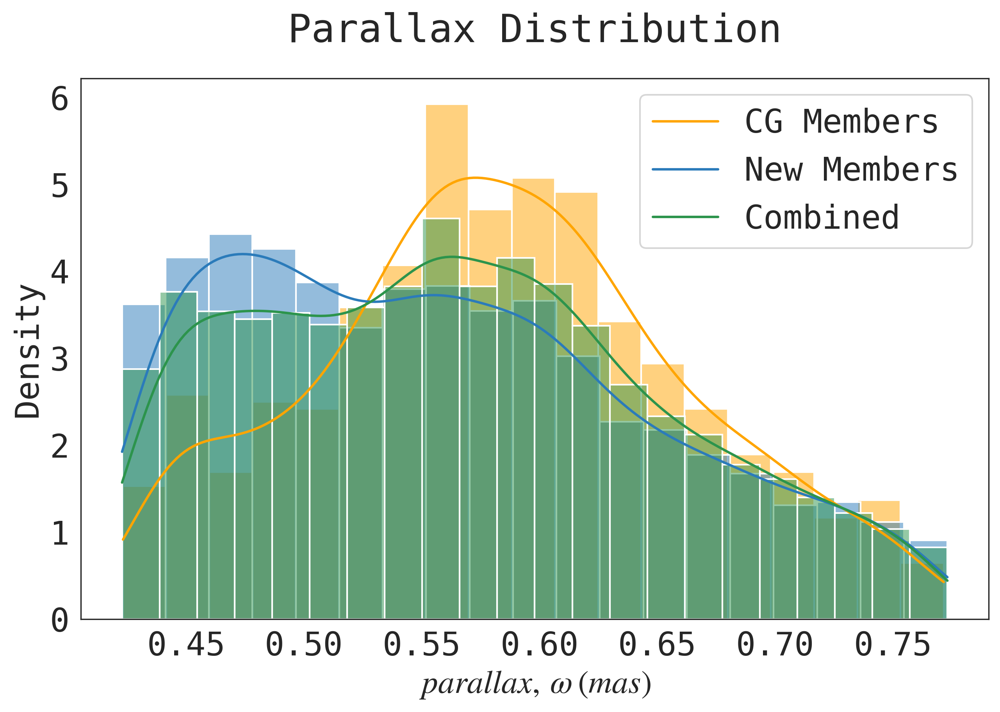

In [151]:
# plot aesthetics
plt.rc('font', family='monospace', size=20, serif='courier')

# plot initialization
plt.figure(figsize=(10,6),dpi=300)

# parallax histogram plotting
sns.histplot(cg_memb_cluster,x='parallax',
            kde=True,stat='density',
            color="Orange",)
sns.histplot(new_memb,x='parallax',
            kde=True,stat='density',
            color=sns.color_palette("Blues").as_hex()[4],)
sns.histplot(cluster,x='parallax',
            kde=True,stat='density',
            color=sns.color_palette("Greens").as_hex()[4],);

# plot attributes
plt.legend(labels=titles)
plt.title('Parallax Distribution',y=1.05)
plt.xlabel(r'$parallax, \: \omega \: (mas)$');

- The 1D histograms of Parallax also aid in the validation of our results. 
  
- The maximum of the combined plot is very close to the parallax of CG members which confirms that the founded new members are indeed in the same vicinity. 

### 3.1.5 CMDs

[None, None]

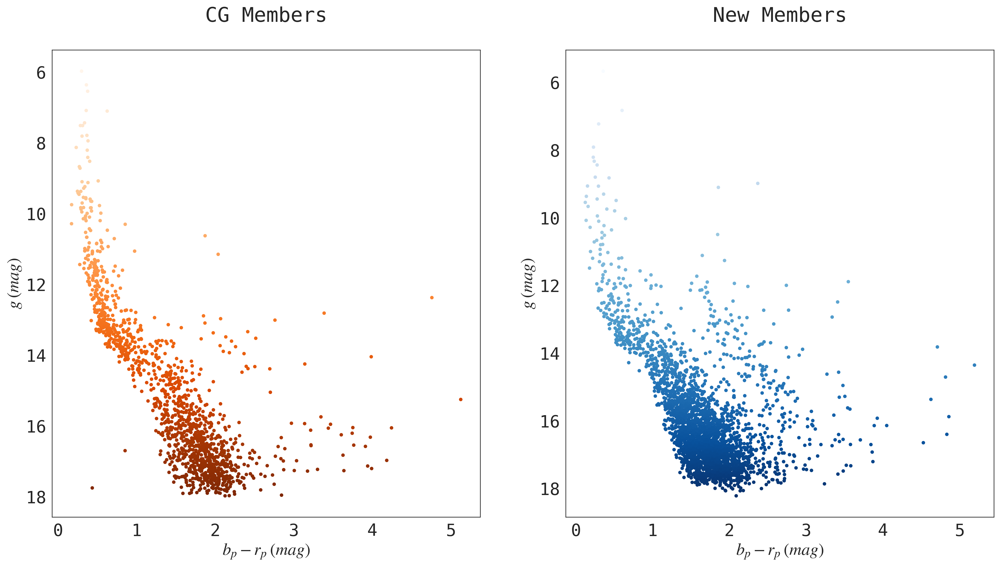

In [159]:
# plot initalization
fig,ax = plt.subplots(1,2,figsize=(20,10),dpi=300)

# CMD scatter plot
ax[0].scatter(cg_memb_cluster['bp_rp'],cg_memb_cluster['phot_g_mean_mag'],
            marker='.',c=cg_memb_cluster['phot_g_mean_mag'],
            cmap='Oranges',s=40
)

ax[1].scatter(new_memb['bp_rp'],new_memb['phot_g_mean_mag'],
            marker='.',c=new_memb['phot_g_mean_mag'],
            cmap=sns.color_palette("Blues",as_cmap=True),s=40
)

# plot attribs
def chart_attribs(axs,title):
    axs.set_xlabel(r'$b_p - r_p \: (mag)$')
    axs.set_ylabel(r'$g \: (mag)$')
    axs.invert_yaxis()
    axs.set_title(title,y=1.05)

titles = ['CG Members', 'New Members']
[chart_attribs(ax[i],titles[i]) for i in range(2)]


- As expected, the new members have populated the CMD but interesting point is that they populate it in a similar way to CG members, therefore, it's safe to say that the new members are members!


## 4. Conclusion 

- So, in the end, we saw how can one use `RF` to determine the memberships of stars in the vicinity of the Open Cluster, resulting in the increment in the cluster population.

- The more the no. of stars we gave, the better estimates of the physical properties we can derive from the observations. 
  
- ML methods are very powerful methods although these methods also demand very stringent tests and astrophysical validation too. 

- But once done correctly, these methods can help us analyse and extract astrophysics in the era of Big Data.